<a href="https://colab.research.google.com/github/MinahilRaza/Image_Analysis_Project1/blob/main/CrowdCounting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [41]:
!mkdir images

mkdir: cannot create directory ‘images’: File exists


In [42]:
import numpy as np
import cv2 as cv
import os
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd

## Auxiliary Functions
Let's define some helper functions

In [43]:
def display_image(img, width = 15, height= 15, sub_plots= (1,1)):
  fig, axs = plt.subplots(sub_plots[0], sub_plots[1])
  fig.set_figwidth(width)
  fig.set_figheight(height)
  if  sub_plots== (1,1):
    image = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    axs.imshow(image)
  else:
    for n,ax in enumerate(axs.flatten()):
        image1 = cv.cvtColor(img[n], cv.COLOR_BGR2RGB)
        ax.imshow(image1)
  plt.show()

In [44]:
def clahe(img: np.ndarray, clip_limit=3.0, grid_size=(5, 5)) -> np.ndarray:
    """Contrast-limited adaptive histogram equalization."""
    image = img.copy().astype('uint8')   # Ensure that the image is of type uint8
    image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=grid_size)
    return clahe.apply(image)

In [45]:
def NMS(boxes, overlapThresh = 0.7):
    #return an empty list, if no boxes given
    if len(boxes) == 0:
        return []
    # edge case 1: so that box spans entire image

    x1 = boxes[:, 0]  # x coordinate of the top-left corner
    y1 = boxes[:, 1]  # y coordinate of the top-left corner
    x2 = boxes[:, 2]  # x coordinate of the bottom-right corner
    y2 = boxes[:, 3]  # y coordinate of the bottom-right corner
    # compute the area of the bounding boxes and sort the bounding
    # boxes by the bottom-right y-coordinate of the bounding box
    areas = (x2 - x1 + 1) * (y2 - y1 + 1) # We have a least a box of one pixel, therefore the +1
    indices = np.arange(len(x1))
    for i,box in enumerate(boxes):
        temp_indices = indices[indices!=i]
        xx1 = np.maximum(box[0], boxes[temp_indices,0])
        yy1 = np.maximum(box[1], boxes[temp_indices,1])
        xx2 = np.minimum(box[2], boxes[temp_indices,2])
        yy2 = np.minimum(box[3], boxes[temp_indices,3])
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        # compute the ratio of overlap
        overlap = (w * h) / areas[temp_indices]
        if np.any(overlap) > overlapThresh:
            indices = indices[indices != i]
    return boxes[indices].astype(int)


In [46]:
num_images = 10
img_path = "./images/"
# read all frames and store in an array
frames = []
for i in range(num_images):
  path = img_path + str(i+1) + '.jpg'
  print(path)
  frame = cv.imread(path)
  frames.append(frame) 

./images/1.jpg
./images/2.jpg
./images/3.jpg
./images/4.jpg
./images/5.jpg
./images/6.jpg
./images/7.jpg
./images/8.jpg
./images/9.jpg
./images/10.jpg


# Region of Interest

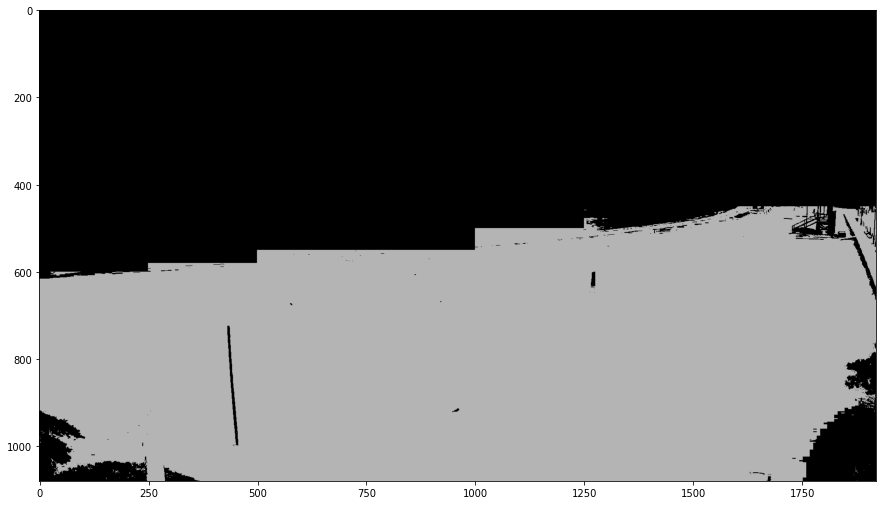

In [47]:
image = cv.cvtColor(frames[0], cv.COLOR_BGR2GRAY)
th, dframe = cv.threshold(image, 100,180, cv.THRESH_BINARY)
dframe[0:450] = 0
dframe[0:600, 0:250] = 0 
dframe[0:580, 250:500] = 0
dframe[0:550, 500:1000] = 0
dframe[0:500, 1000:1250] = 0
#kernel = np.ones((5,5), np.uint8)
#dframe = cv.dilate(dframe, kernel, iterations=1)
display_image(dframe)
ROI_mask = dframe

# Background Subtraction

## Estimating a Background

## Mathod 1
OpenCV Background Subtractor

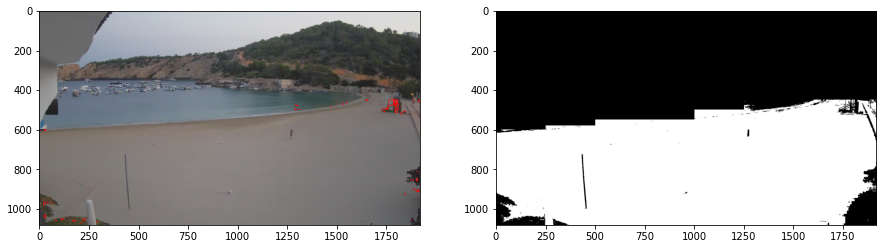

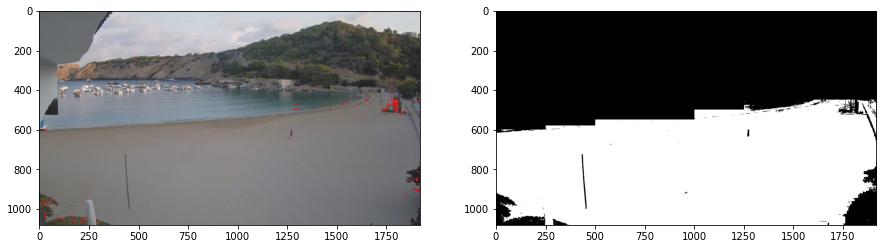

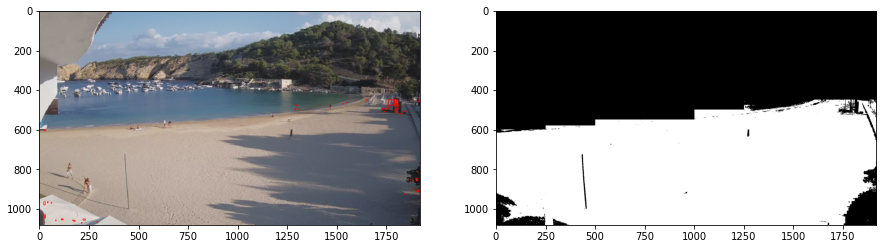

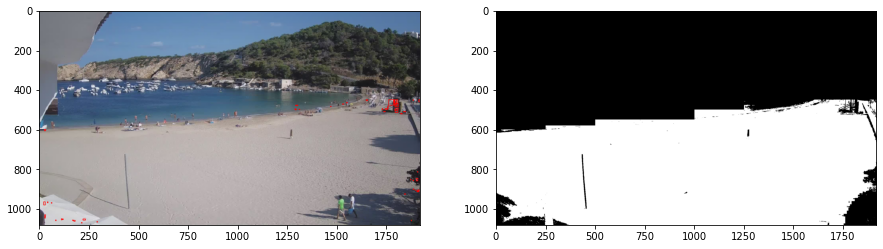

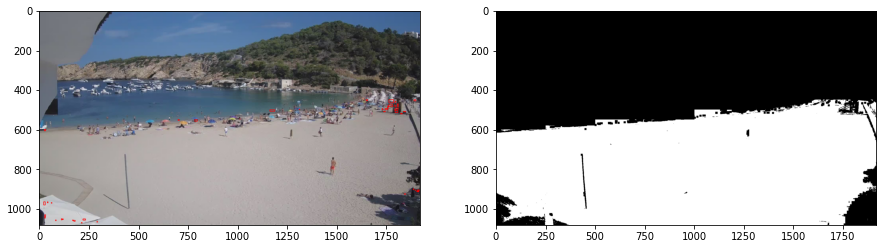

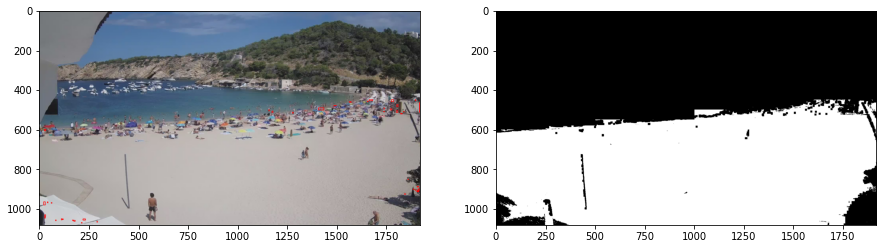

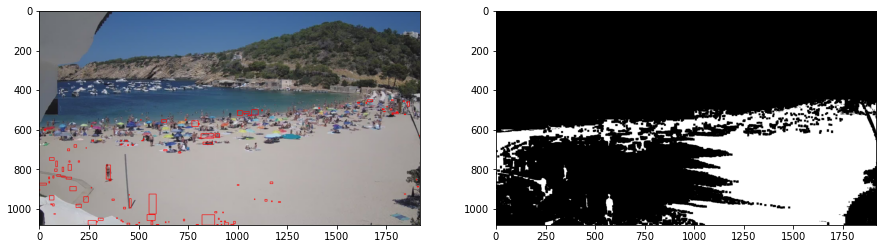

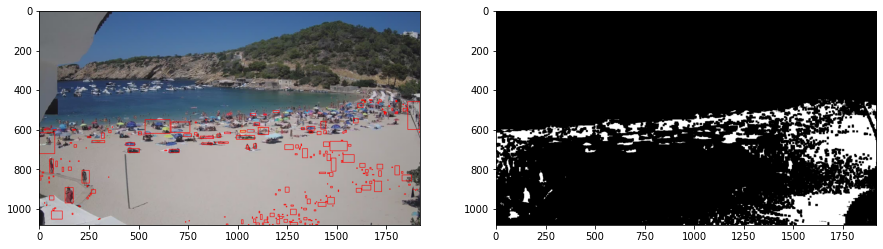

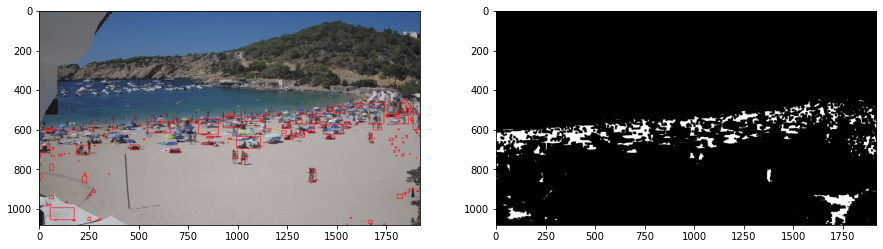

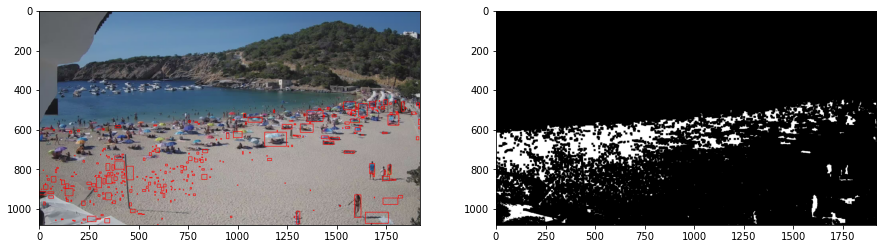

In [48]:
boxes_all1 = []
backSub = cv.createBackgroundSubtractorKNN()
for frame in frames:
  frame = cv.GaussianBlur(frame.copy(),(5,5),0)
  fgMask = backSub.apply(frame)
  th, dframe = cv.threshold(fgMask, 120, 255, cv.THRESH_BINARY)
  thresh = cv.cvtColor(dframe, cv.COLOR_BGR2RGB)
  kernel = np.ones((10,10), np.uint8)
  dframe = cv.erode(dframe, kernel, iterations=1)
  dframe = np.logical_and(ROI_mask, dframe)
  dframe = dframe.astype("uint8")
  #imgs.append(thresh)
  contours = cv.findContours(dframe, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
  contours = contours[0] if len(contours) == 2 else contours[1]
  boxes = []
  for cntr in contours:
      x,y,w,h = cv.boundingRect(cntr)
      if w*h>10000:
        continue
      if w*h <8:
        continue
      boxes.append([x, y, x+w, y+h])
  boxes = NMS(np.array(boxes))
  for box in boxes:
      (x, y, x1, y1) = box
      cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
  boxes_all1.append(boxes)
  display_image([frame, dframe*255], sub_plots= (1,2))

Let's try CLAHE with this method to see if normalizing would solve these illumination related issues

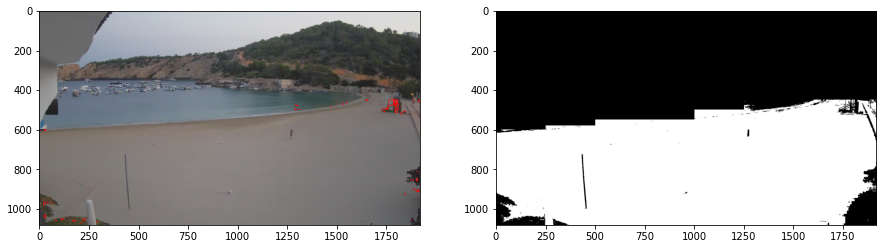

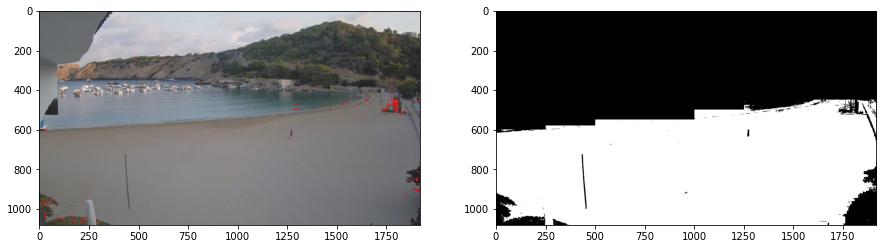

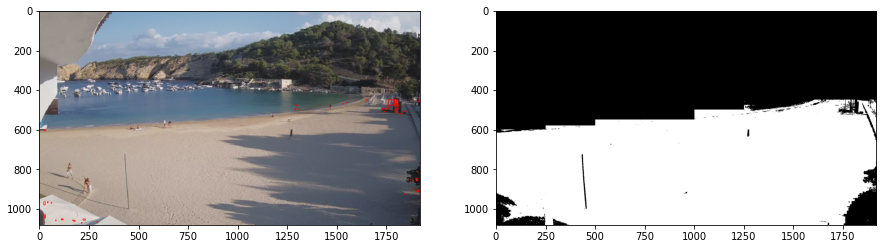

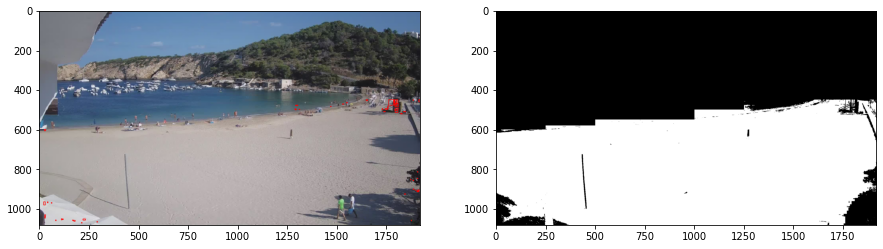

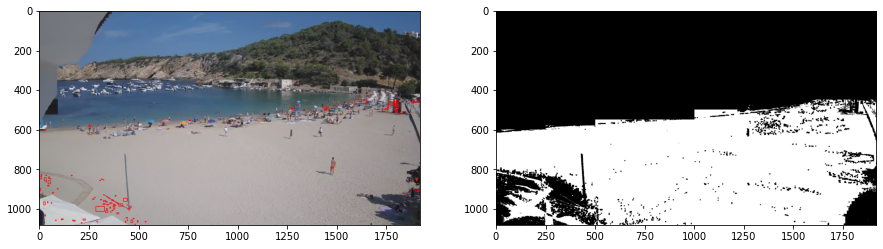

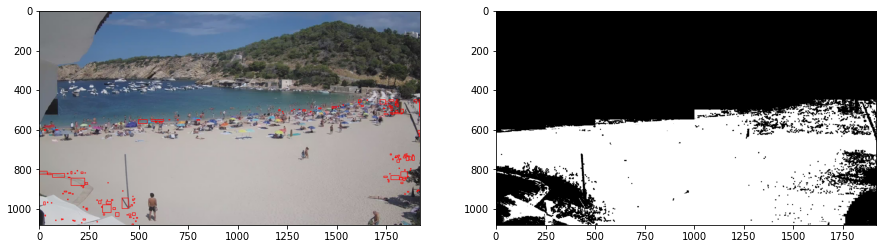

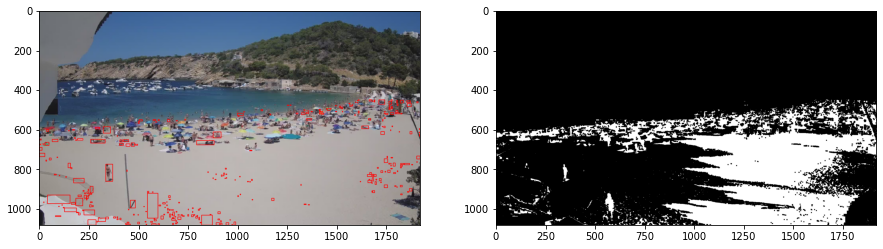

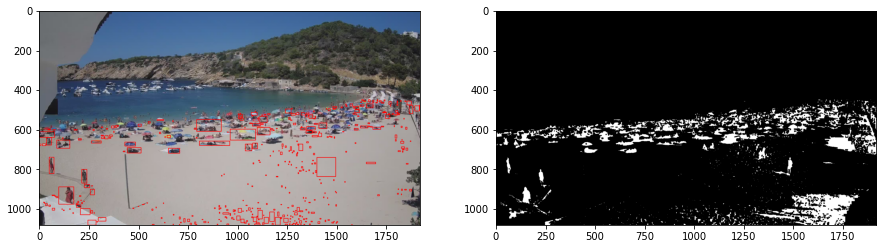

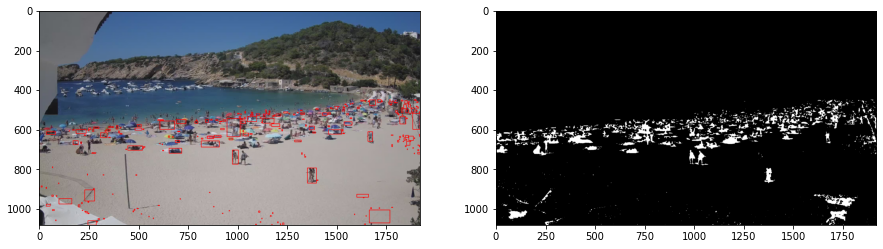

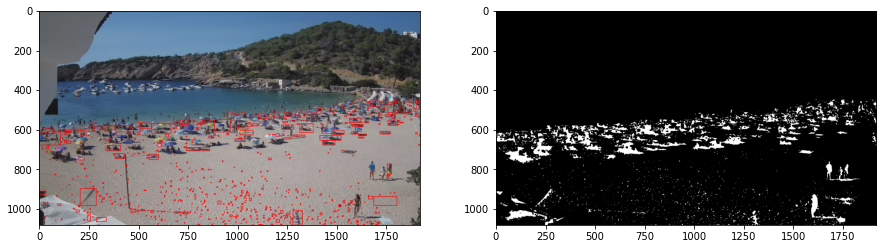

In [49]:
boxes_all2 = []
backSub = cv.createBackgroundSubtractorKNN()
for frame in frames:
  frame = cv.GaussianBlur(frame.copy(),(5,5),0)
  fgMask = backSub.apply(clahe(frame))
  th, dframe = cv.threshold(fgMask, 120, 255, cv.THRESH_BINARY)
  thresh = cv.cvtColor(dframe, cv.COLOR_BGR2RGB)
  kernel = np.ones((5,5), np.uint8)
  dframe = cv.erode(dframe, kernel, iterations=1)
  dframe = np.logical_and(ROI_mask, dframe)
  dframe = dframe.astype("uint8")
  #imgs.append(thresh)
  contours = cv.findContours(dframe, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
  contours = contours[0] if len(contours) == 2 else contours[1]
  boxes = []
  for cntr in contours:
      x,y,w,h = cv.boundingRect(cntr)
      if w*h>10000:
        continue
      if w*h <8:
        continue
      boxes.append([x, y, x+w, y+h])
  boxes = NMS(np.array(boxes))
  for box in boxes:
      (x, y, x1, y1) = box
      cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
  boxes_all2.append(boxes)
  display_image([frame, dframe*255], sub_plots= (1,2))

To get an idea of what is happening here, let's plot the histograms of the two images

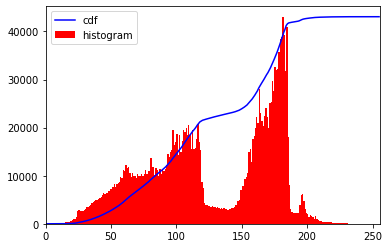

In [50]:
img = cv.cvtColor(frames[6], cv.COLOR_BGR2GRAY)
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

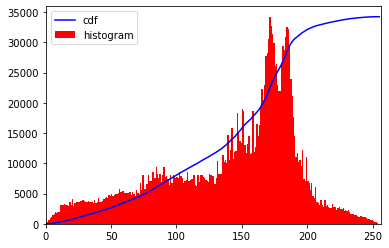

In [51]:
img = clahe(frames[6].copy())
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

### Shadow Removal
As you can see if the code above, I neglect boxes with area above 10000. This is because these boxes correspong to the shadow and are causing issues with my detection. I tried to remove the shadow by using normalization preprocessing but the edge is too sharp to be removed by that

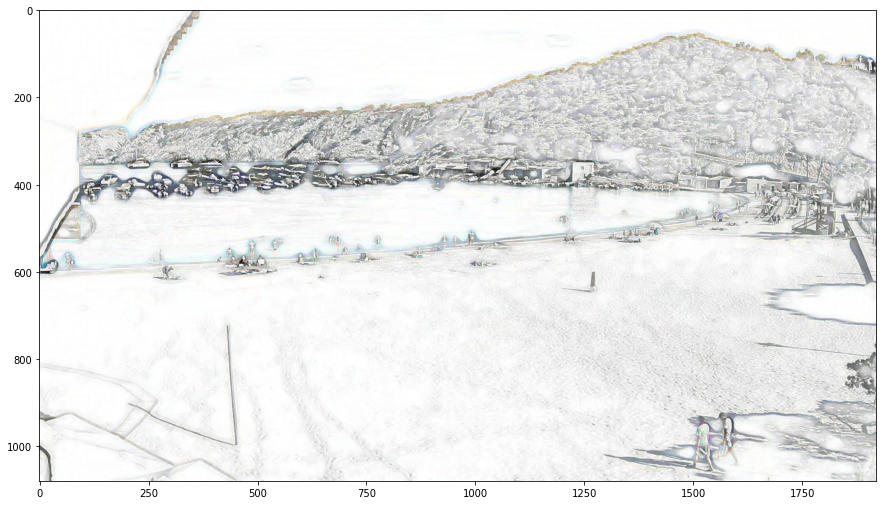

In [52]:
## shadow removal

img = frames[3]

rgb_planes = cv.split(img)

result_planes = []
result_norm_planes = []
for plane in rgb_planes:
    dilated_img = cv.dilate(plane, np.ones((11,11), np.uint8))
    bg_img = cv.medianBlur(dilated_img, 21)
    diff_img = 255 - cv.absdiff(plane, bg_img)
    norm_img = cv.normalize(diff_img,None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX, dtype=cv.CV_8UC1)
    result_planes.append(diff_img)
    result_norm_planes.append(norm_img)

result = cv.merge(result_planes)
result_norm = cv.merge(result_norm_planes)

display_image(result_norm)


## Method 2
Median Filter

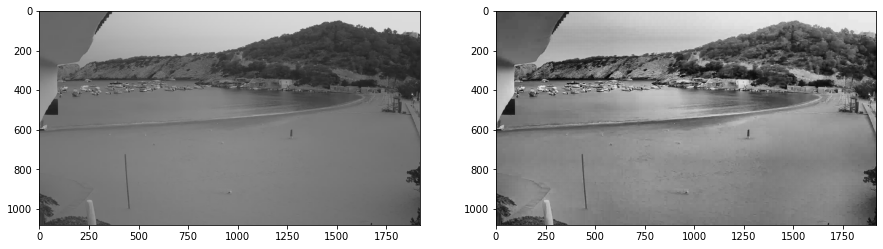

In [53]:
medianFrame = np.median(frames[0:1], axis=0).astype(dtype=np.uint8)
# you can compute mean of all images and subtract that by adding a weight as well
# Convert background to grayscale
grayMedianFrame = cv.cvtColor(medianFrame, cv.COLOR_BGR2GRAY)
display_image([grayMedianFrame, clahe(medianFrame)], sub_plots= (1,2))

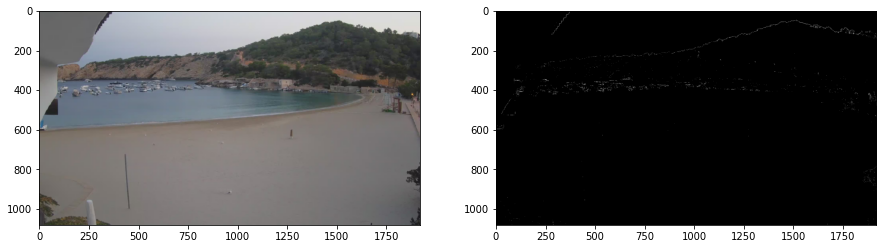

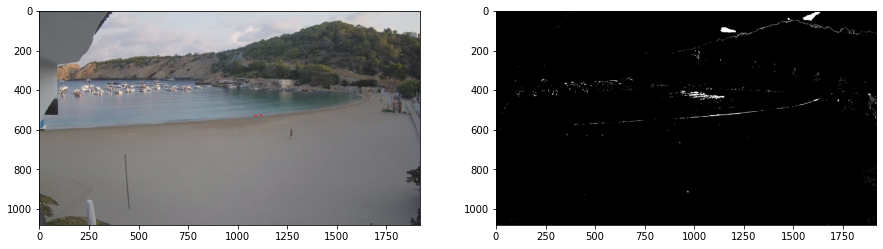

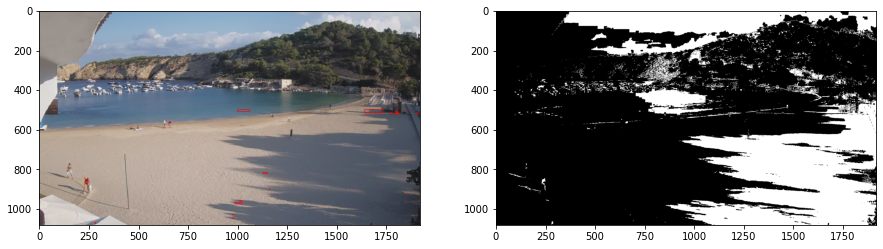

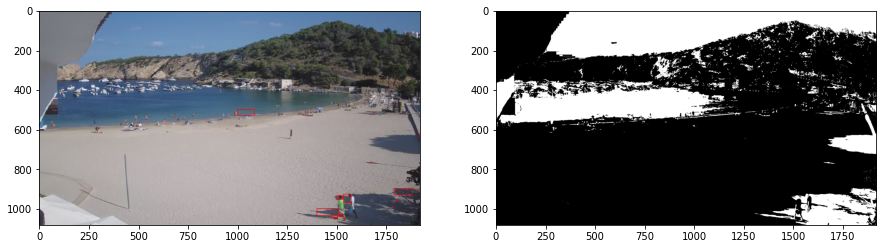

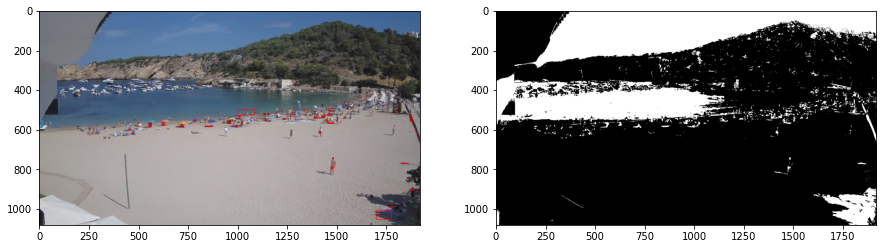

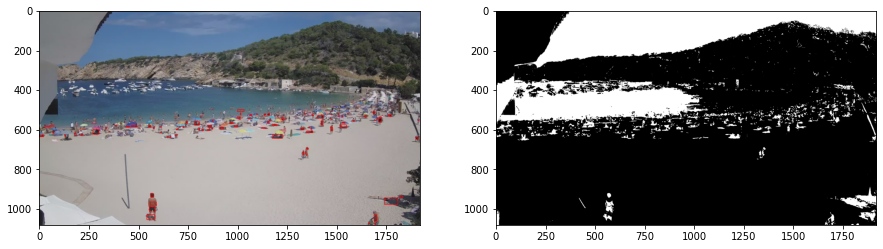

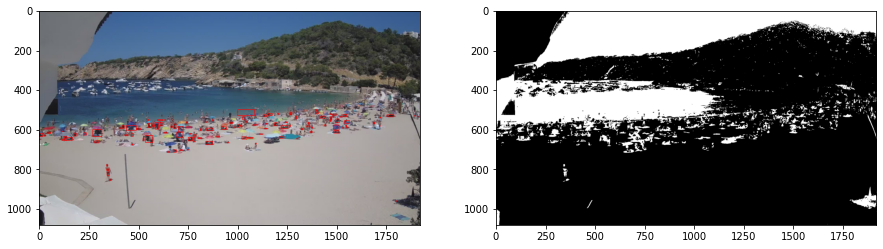

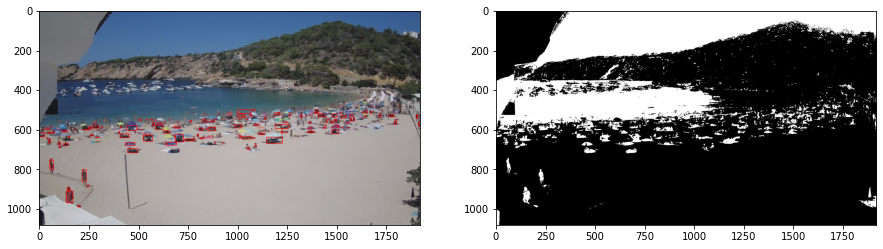

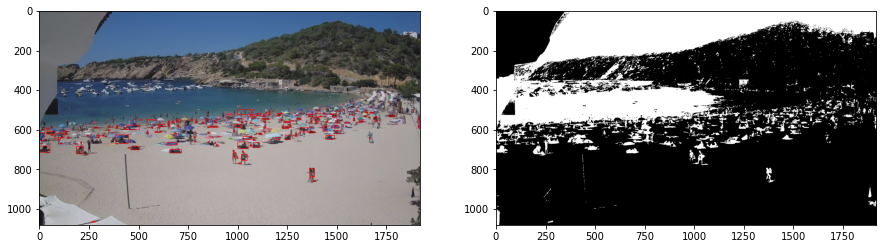

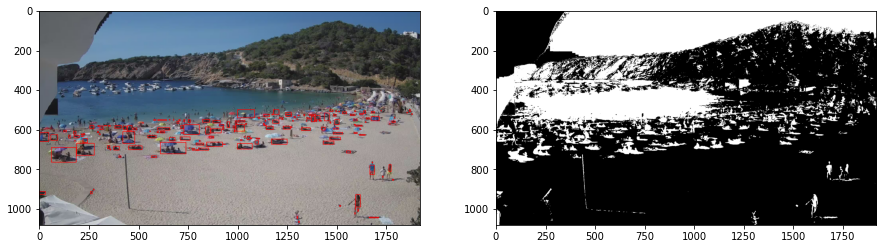

In [54]:
#frames = []
boxes_all3 = []
for frame in frames:
  frame = cv.GaussianBlur(frame.copy(),(5,5),0)
  grayFrame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
  #grayFrame = clahe(frame)
  #display_image(frame)
  fgMask = cv.subtract(grayMedianFrame, grayFrame) 
  #fgMask = backSub.apply(clahe(frame))
  th, dframe = cv.threshold(fgMask, 20, 255, cv.THRESH_BINARY)
  thresh = cv.cvtColor(dframe, cv.COLOR_BGR2RGB)
  kernel = np.ones((5,5), np.uint8)
  dframe1 = dframe.copy()
  dframe = cv.erode(dframe, kernel, iterations=1)
  dframe = np.logical_and(ROI_mask, dframe).astype("uint8")
  #imgs.append(thresh)
  contours = cv.findContours(dframe, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
  contours = contours[0] if len(contours) == 2 else contours[1]
  boxes = []
  for cntr in contours:
      x,y,w,h = cv.boundingRect(cntr)
      if y<500:
        continue
      if w*h>10000:
        continue
      if w*h <8:
        continue
      boxes.append([x, y, x+w, y+h])
  boxes = NMS(np.array(boxes))
  for box in boxes:
      (x, y, x1, y1) = box
      cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
  boxes_all3.append(boxes)
  display_image([frame, thresh], sub_plots= (1,2))

Let's combine CLAHE with this approach as well

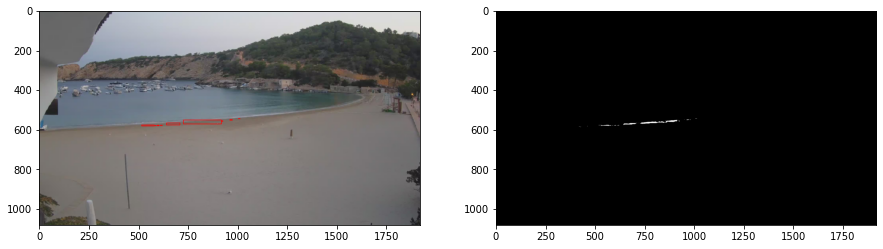

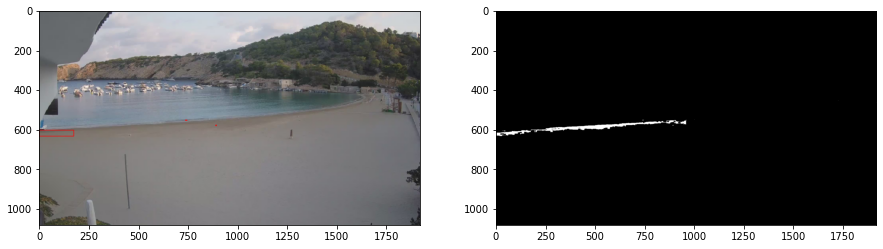

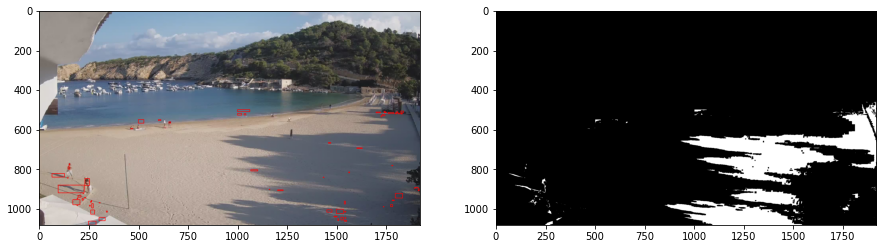

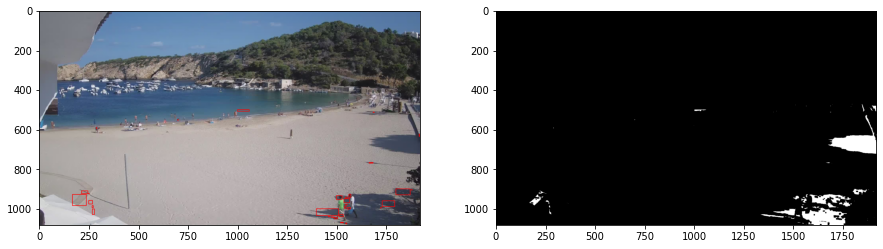

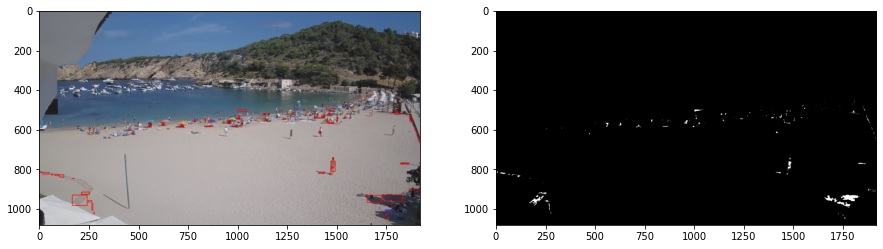

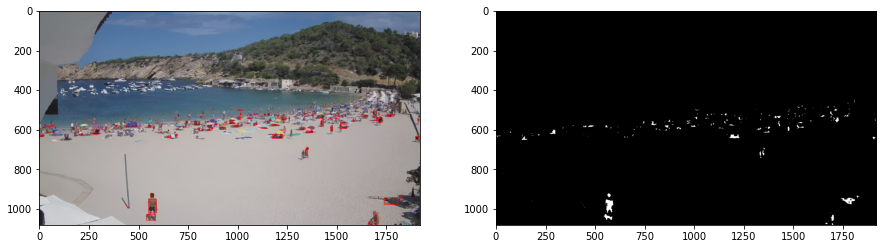

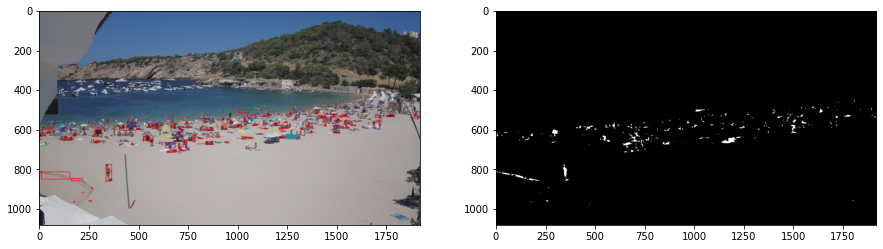

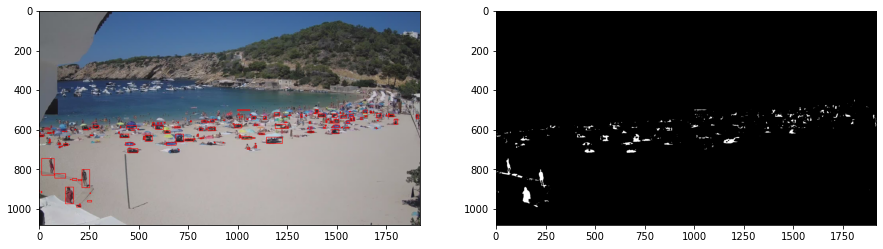

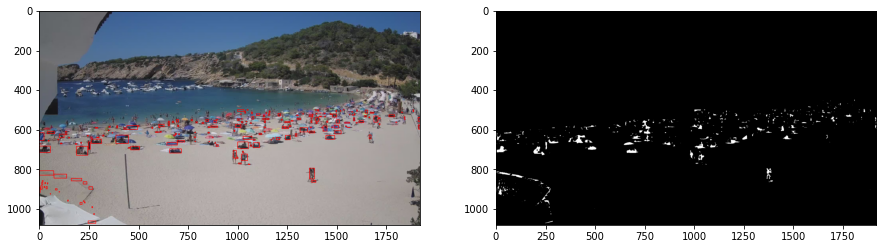

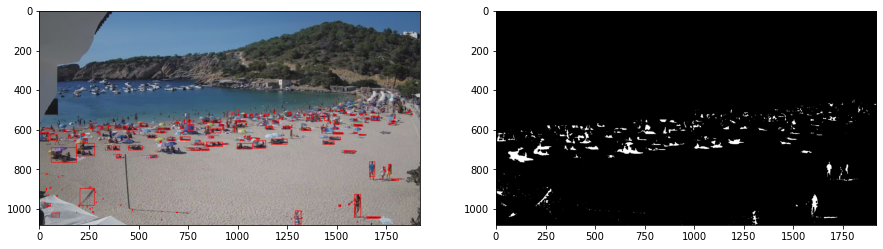

In [55]:
boxes_all4 = []
for frame in frames:
  frame = cv.GaussianBlur(frame.copy(),(5,5),0)
  grayFrame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
  grayFrame = clahe(frame)
  fgMask = cv.subtract(grayMedianFrame, grayFrame) 
  th, dframe = cv.threshold(fgMask, 20, 255, cv.THRESH_BINARY)
  thresh = cv.cvtColor(dframe, cv.COLOR_BGR2RGB)
  kernel = np.ones((5,5), np.uint8)
  dframe1 = dframe.copy()
  dframe = cv.erode(dframe, kernel, iterations=1)
  dframe = np.logical_and(ROI_mask, dframe).astype("uint8")
  contours = cv.findContours(dframe, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
  contours = contours[0] if len(contours) == 2 else contours[1]
  boxes = []
  for cntr in contours:
      x,y,w,h = cv.boundingRect(cntr)
      if y<500:
        continue
      if w*h>10000:
        continue
      if w*h <8:
        continue
      boxes.append([x, y, x+w, y+h])
  boxes = NMS(np.array(boxes))
  for box in boxes:
      (x, y, x1, y1) = box
      cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
  boxes_all4.append(boxes)
  display_image([frame, dframe*255], sub_plots= (1,2))

## Method 3
Mean Filter

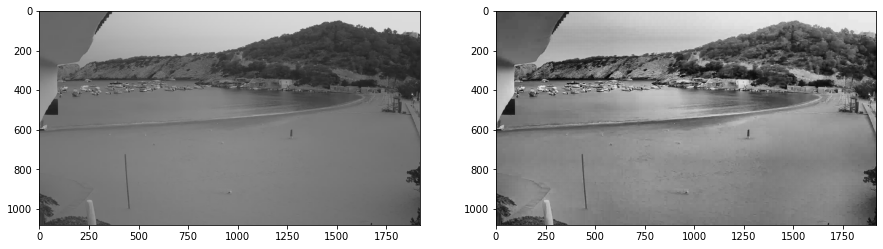

In [56]:
meanFrame = np.mean(frames[0:1], axis=0).astype(dtype=np.uint8)
grayMeanFrame = cv.cvtColor(meanFrame, cv.COLOR_BGR2GRAY)
display_image([grayMeanFrame, clahe(meanFrame)], sub_plots= (1,2))

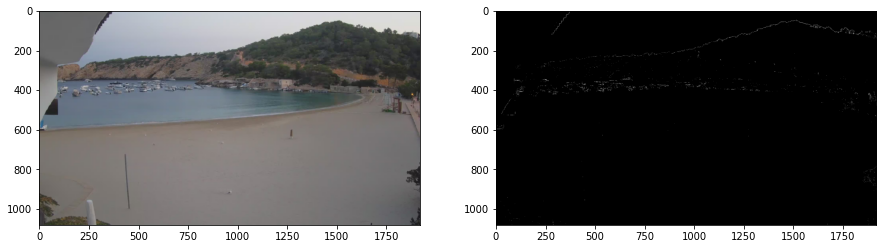

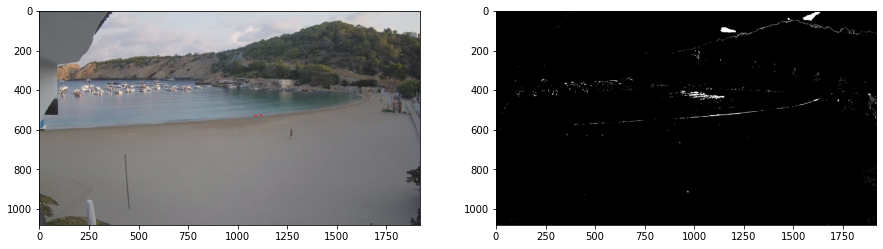

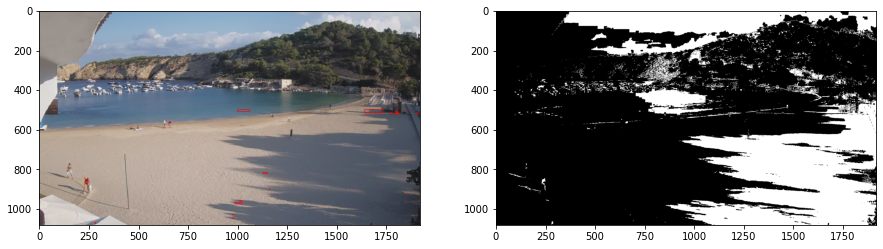

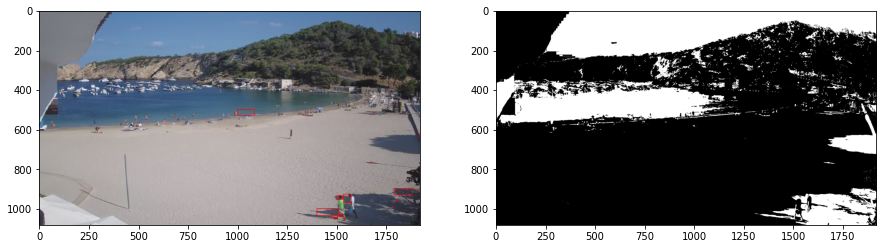

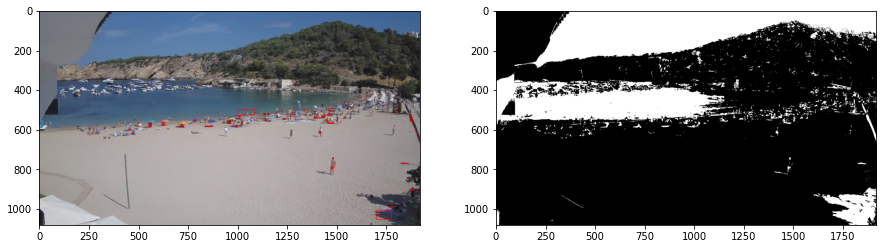

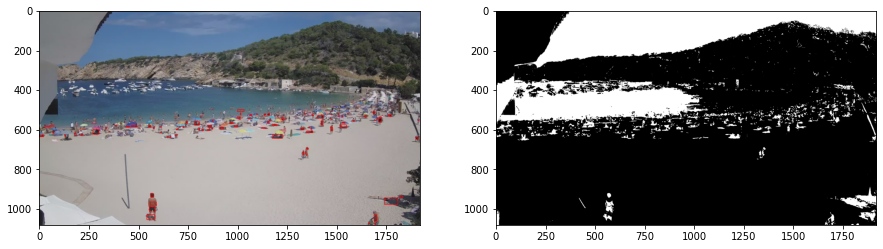

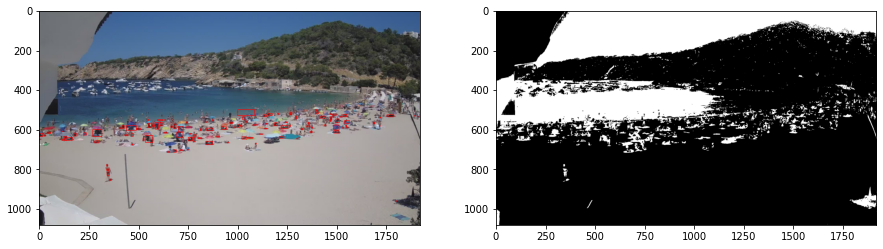

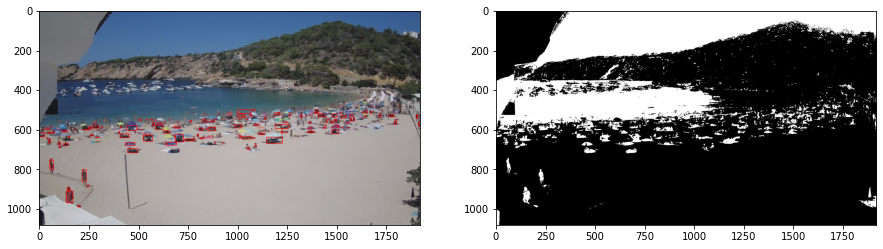

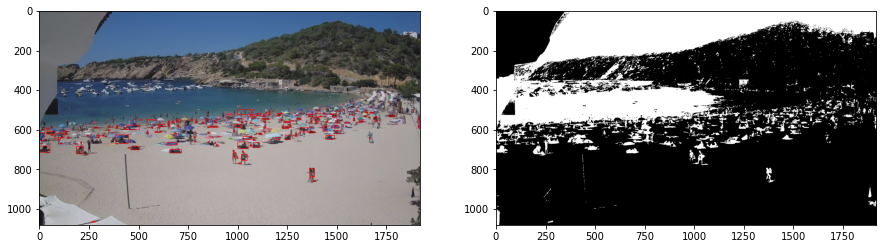

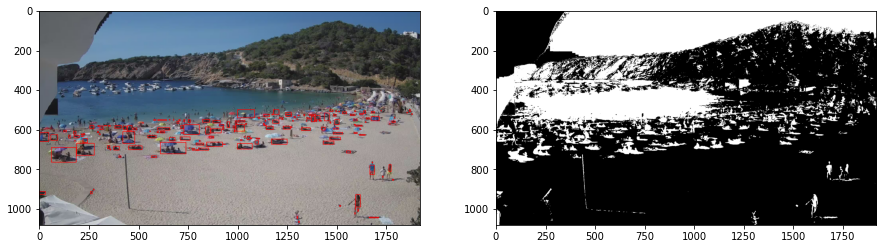

In [57]:
#frames = []
boxes_all5 = []
for frame in frames:
  frame = cv.GaussianBlur(frame.copy(),(5,5),0)
  grayFrame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
  #grayFrame = clahe(frame)
  #display_image(frame)
  fgMask = cv.subtract(grayMeanFrame, grayFrame) 
  #fgMask = backSub.apply(clahe(frame))
  th, dframe = cv.threshold(fgMask, 20, 255, cv.THRESH_BINARY)
  thresh = cv.cvtColor(dframe, cv.COLOR_BGR2RGB)
  kernel = np.ones((5,5), np.uint8)
  dframe1 = dframe.copy()
  dframe = cv.erode(dframe, kernel, iterations=1)
  dframe = np.logical_and(ROI_mask, dframe).astype("uint8")
  #imgs.append(thresh)
  contours = cv.findContours(dframe, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
  contours = contours[0] if len(contours) == 2 else contours[1]
  boxes = []
  for cntr in contours:
      x,y,w,h = cv.boundingRect(cntr)
      if y<500:
        continue
      if w*h>10000:
        continue
      if w*h <8:
        continue
      boxes.append([x, y, x+w, y+h])
  boxes = NMS(np.array(boxes))
  for box in boxes:
      (x, y, x1, y1) = box
      cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
  boxes_all5.append(boxes)
  display_image([frame, thresh], sub_plots= (1,2))

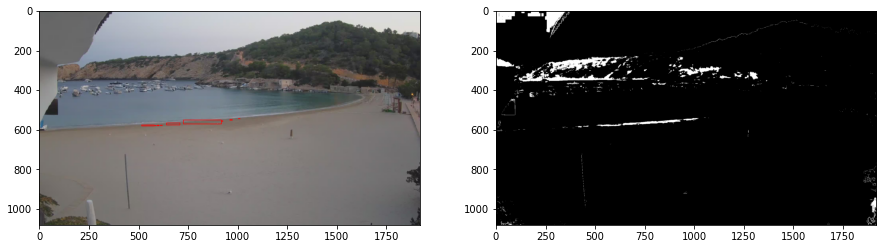

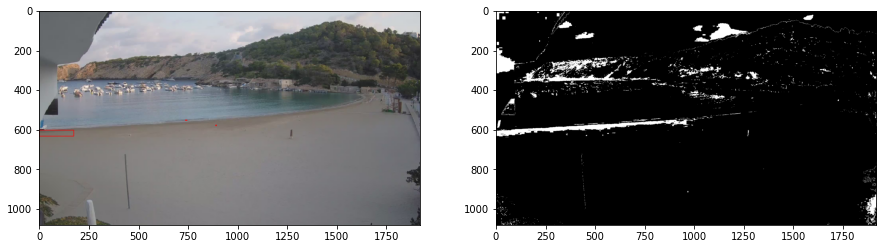

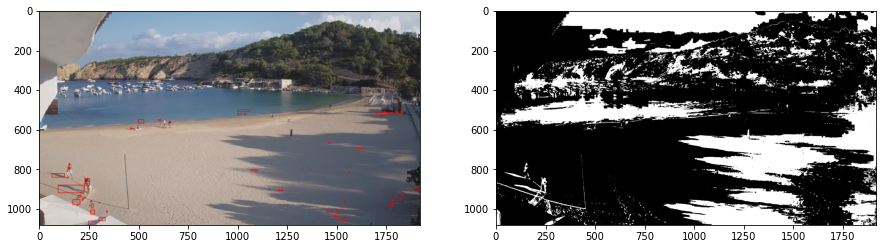

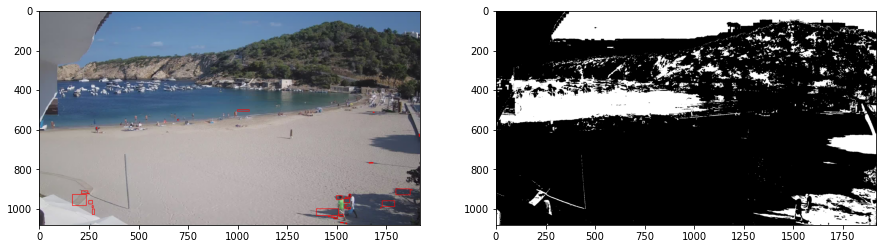

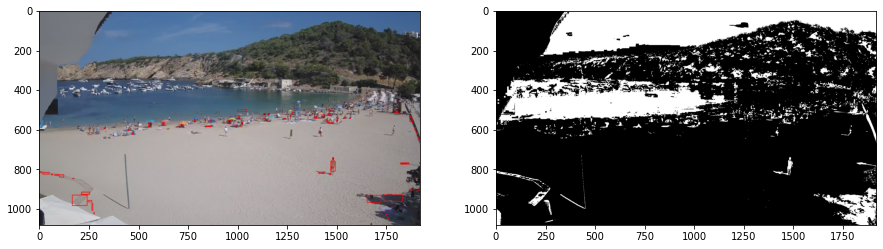

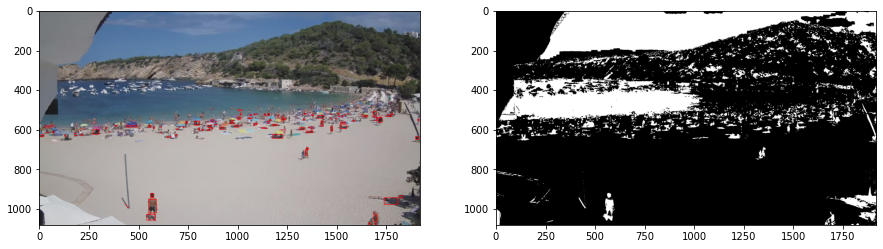

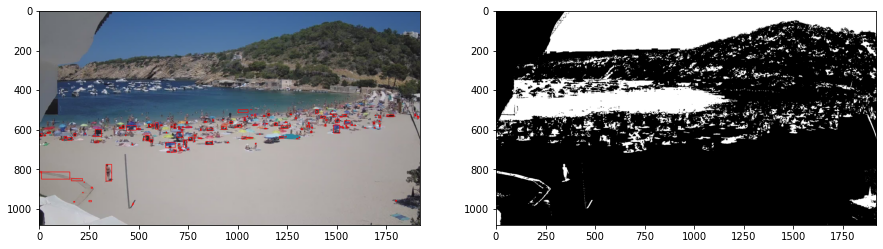

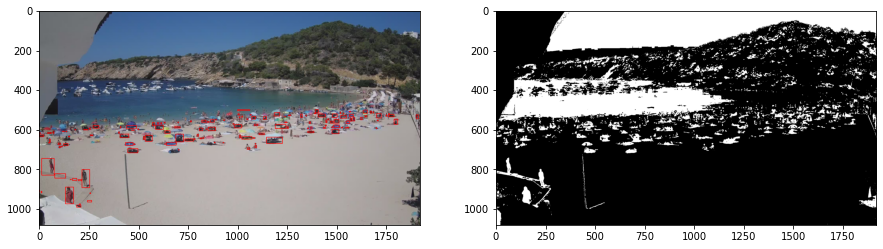

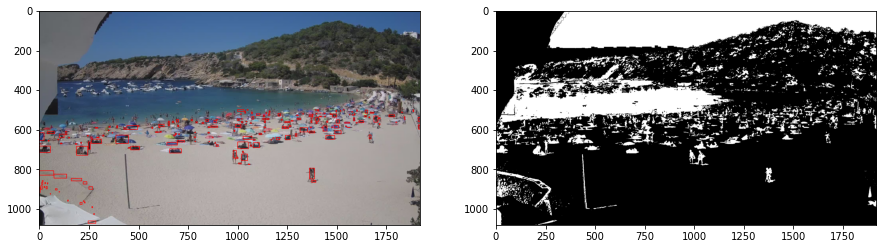

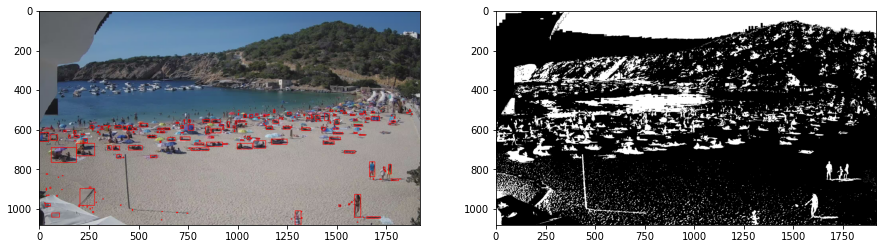

In [58]:
#frames = []
boxes_all6 = []
for frame in frames:
  frame = cv.GaussianBlur(frame.copy(),(5,5),0)
  grayFrame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
  grayFrame = clahe(frame)
  fgMask = cv.subtract(grayMeanFrame, grayFrame) 
  #fgMask = backSub.apply(clahe(frame))
  th, dframe = cv.threshold(fgMask, 20, 255, cv.THRESH_BINARY)
  thresh = cv.cvtColor(dframe, cv.COLOR_BGR2RGB)
  kernel = np.ones((5,5), np.uint8)
  dframe1 = dframe.copy()
  dframe = cv.erode(dframe, kernel, iterations=1)
  dframe = np.logical_and(ROI_mask, dframe).astype("uint8")
  #imgs.append(thresh)
  contours = cv.findContours(dframe, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
  contours = contours[0] if len(contours) == 2 else contours[1]
  boxes = []
  for cntr in contours:
      x,y,w,h = cv.boundingRect(cntr)
      if y<500:
        continue
      if w*h>10000:
        continue
      if w*h <8:
        continue
      boxes.append([x, y, x+w, y+h])
  boxes = NMS(np.array(boxes))
  for box in boxes:
      (x, y, x1, y1) = box
      cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
  boxes_all6.append(boxes)
  display_image([frame, thresh], sub_plots= (1,2))

## Post-processing

We have many spurios predictions. Let's see if we can fix them using some method
Get bounding boxes and resize to the same size

### Mathod 1: Unsupervised Clustering

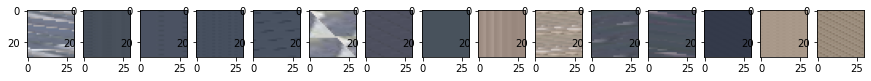

In [59]:
patches = []
patches_flattened = []

i = 2
for boxes in boxes_all6[2:]:
   frame = frames[i].copy()
   for box in boxes:
    (x, y, x1, y1) = box
    image_box = frame[y:y1, x:x1, :]
    patches.append(np.resize(image_box, (30,30,3)))
    patches_flattened.append(np.resize(image_box, (30,30,3)).flatten())
   i += 1
display_image(patches, sub_plots=(1,15))

In [60]:
len(patches)== sum([len(i) for i in boxes_all6[2:]])

True

In [61]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)
kmeans.fit(patches_flattened)


KMeans(n_clusters=2)

In [62]:
cluster1_boxes = []
cluster2_boxes = []

i = 0
for boxes in boxes_all6[2:]:
  boxes = np.array(boxes)
  k = len(boxes)
  cluster1_boxes.append(boxes[kmeans.labels_[i:i+k]==1])
  cluster2_boxes.append(boxes[kmeans.labels_[i:i+k]!=1])
  print(k, len(boxes[kmeans.labels_[i:i+k]==1]), len(boxes[kmeans.labels_[i:i+k]!=1]))
  i = k


66 36 30
30 23 7
79 51 28
107 81 26
132 103 29
140 114 26
195 149 46
192 147 45


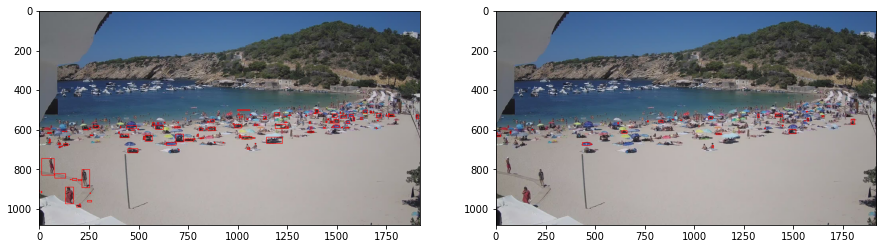

In [63]:
frame_num = 7
i = 0
frame = frames[frame_num].copy()
for box in cluster1_boxes[frame_num -2]:
    (x, y, x1, y1) = box
    cv.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
    i +=1

frame1 = frames[frame_num].copy()
for box in cluster2_boxes[frame_num -2]:
    (x, y, x1, y1) = box
    cv.rectangle(frame1, (x, y), (x1, y1), (0, 0, 255), 2)
    i +=1
display_image([frame, frame1], sub_plots=(1,2))

### Method 2: Supervised Learning
Here we use HOG transform to classify detected objects as humans. The detailed code for training is in the other notebook. Here, we use the saved model to find the labels for each box

In [64]:
def pad(A, shape):
   out = np.zeros(shape)
   out[tuple(slice(0, d) for d in np.shape(A))] = A
   return out

In [65]:
## Train a hog classifier


In [66]:
from sklearn import svm
from skimage.feature import hog
from skimage import data, exposure

In [67]:
labels = pd.read_csv("labels.csv")
background = pd.read_csv("background.csv")
labels.head()

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
0,person,1285,1008,33,72,10.jpg,1920,1080
1,person,1588,922,35,116,10.jpg,1920,1080
2,person,1658,758,39,101,10.jpg,1920,1080
3,person,1715,784,31,74,10.jpg,1920,1080
4,person,1754,769,22,88,10.jpg,1920,1080


In [68]:
def pad(A, shape):
   out = np.zeros(shape)
   out[tuple(slice(0, d) for d in np.shape(A))] = A
   return out

In [69]:
# image labels
boxes = labels[labels.image_name == '10.jpg'][['bbox_x', 'bbox_y', 'bbox_width' , 'bbox_height']].to_numpy()
# image need to be grayscale
frame = cv.cvtColor(frames[9], cv.COLOR_BGR2GRAY)
patch_shape = (150, 120)
patches = []
# take a crop and pad with zeros to get patches of same shape
for box in boxes:
  (x, y, w, h) = box
  w1 = patch_shape[0]- w
  w1 = int(w/2)
  h1 = patch_shape[1]- h
  h1 = int(h/2)
  image_box = frame[y:y+h, x:x+w]
  image_box = pad(image_box, patch_shape)
  patches.append(image_box.astype('uint8'))

In [70]:
boxes = background[background.image_name == '10.jpg'][['bbox_x', 'bbox_y', 'bbox_width' , 'bbox_height']].to_numpy()
patches_bg = []
# take a crop and pad with zeros to get patches of same shape
for box in boxes:
  (x, y, w, h) = box
  w1 = patch_shape[0]- w
  w1 = int(w/2)
  h1 = patch_shape[1]- h
  h1 = int(h/2)
  image_box = frame[y:y+h, x:x+w]
  image_box = pad(image_box, patch_shape)
  patches_bg.append(image_box.astype('uint8'))

boxes = background[background.image_name == '1.jpg'][['bbox_x', 'bbox_y', 'bbox_width' , 'bbox_height']].to_numpy()
frame = cv.cvtColor(frames[0], cv.COLOR_BGR2GRAY)
for box in boxes:
  (x, y, w, h) = box
  w1 = patch_shape[0]- w
  w1 = int(w/2)
  h1 = patch_shape[1]- h
  h1 = int(h/2)
  image_box = frame[y:y+h, x:x+w]
  image_box = pad(image_box, patch_shape)
  patches_bg.append(image_box.astype('uint8'))

frame = cv.cvtColor(frames[1], cv.COLOR_BGR2GRAY)
for box in boxes:
  (x, y, w, h) = box
  w1 = patch_shape[0]- w
  w1 = int(w/2)
  h1 = patch_shape[1]- h
  h1 = int(h/2)
  image_box = frame[y:y+h, x:x+w]
  image_box = pad(image_box, patch_shape)
  patches_bg.append(image_box.astype('uint8'))

In [71]:
hog_positive = []
hog_negative = []

for image in patches:
  hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm="L2", transform_sqrt=True, feature_vector=True)
  hog_positive.append(hog_image)
for image in patches_bg:
  hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm="L2", transform_sqrt=True, feature_vector=True)
  hog_negative.append(hog_image)

In [72]:
y = [1]*len(hog_positive)
y_neg = [0]*len(hog_negative)
y.extend(y_neg)

X = hog_positive
X.extend(hog_negative)

from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix, accuracy_score
X, y = shuffle(X, y, random_state = 0)

clf1 = svm.LinearSVC(C=0.01, max_iter=1000, class_weight='balanced', verbose = 1)
clf1.fit(X, y)

y_pred = clf1.predict(X)

# Evaluating the accuracy of the model using the sklearn functions
accuracy = accuracy_score(y,y_pred)*100
print(accuracy)
confusion_mat = confusion_matrix(y,y_pred)

[LibLinear]89.43298969072166


0
1
2
3
4
5
6
7
8
9


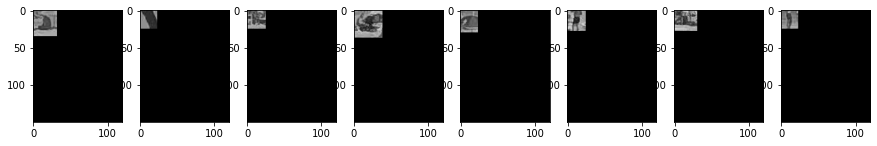

In [73]:
patches = []

i = 0
patch_shape = (150, 120)
for boxes in boxes_all6:
  print(i)
  frame = frames[i].copy()
  frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
  for box in boxes:
    x1, y1, x2, y2 = box
    w = abs(x2-x1)
    h = abs(y2-y1)

    x1 = max(0,x1-10)
    y1 = max(0,y1-10)
    x2 = min(x2+10, frame.shape[1])
    y2 = min(y2+10, frame.shape[0])

    if abs(x1-x2)>patch_shape[1]:
      x2 = x1 + patch_shape[1]
    if abs(y1-y2)>patch_shape[0]:
      y2 = y1 + patch_shape[0]
    

    image_box = frame[y1:y2, x1:x2]
    image_box = pad(image_box, patch_shape)

    patches.append(image_box.astype('uint8'))
  i +=1

display_image(patches[150:], sub_plots=(1,8))

In [74]:
X_test = []
for image in patches:
  hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm="L2", transform_sqrt=True, feature_vector=True)
  X_test.append(hog_image)

In [75]:
y_pred = np.array(clf1.predict(X_test))
np.unique(y_pred, return_counts = True)

(array([0, 1]), array([310, 643]))

In [76]:
hog_boxes = []
hog_neg_boxes = []

i = 0
for boxes in boxes_all6:
  boxes = np.array(boxes)
  k = len(boxes)
  hog_boxes.append(boxes[y_pred[i:i+k]==1])
  hog_neg_boxes.append(boxes[y_pred[i:i+k]!=1])
  i = k


In [77]:
print(len(hog_boxes), len(hog_neg_boxes))

10 10


# Quantifying Results
We will look at two levels: 
1. Image-level: Were the number of people correctly detected?
  - Mean Squared Error
  -  
2. Person-level: Were the positions of people correctly detected?

In [78]:
gt_boxes_arr = []
for i in range(1,11):
  key = str(i)+'.jpg'
  arr = labels[labels.image_name == key][['bbox_x', 'bbox_y', 'bbox_width' , 'bbox_height']].to_numpy()
  gt_boxes_arr.append(arr)

In [107]:
def image_level_mse(gt_boxes_arr, pred_boxes_arr):
  diffs = []
  for gt_boxes, pred_boxes in zip(gt_boxes_arr, pred_boxes_arr):
    diff = len(gt_boxes) - len(pred_boxes)
    diffs.append(diff)
  mse = np.mean(np.array(diffs)**2)
  print(diffs)
  print("Mean Squared Error (lower is better): ", mse)
  return mse, diffs

def person_level_accuracy(gt_boxes_arr, pred_boxes_arr):
  total_misses = []
  TP = []
  for gt_boxes, pred_boxes in zip(gt_boxes_arr, pred_boxes_arr):
    gt_boxes = np.array(gt_boxes)
    pred_boxes = np.array(pred_boxes)
    misses = 0
    tp = []
    for gt_box in gt_boxes:
      # for each box in gt_box, we find the GT boxes in its vicinity
      (x1, y1, w, h) = gt_box
      boi = pred_boxes[(abs(pred_boxes[:,0]-x1)<= 20) & (abs(pred_boxes[:,1]-y1)<= 20)]
      iou_boi = []
      for p_box in boi:
        x_1, y_1, x_2, y_2 = p_box
        inter_box_top_left = [max(x1, x_1), max(y1, y_1)]
        inter_box_bottom_right = [min(x1+w, x_2), min(y1+h, y_2)]
        inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
        inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]
        intersection = abs(inter_box_w * inter_box_h)
        union = abs((x_1-x_2)*(y_1-y_2)) + w*h - intersection
        if 100*intersection/union>= 1:
          tp.append(p_box)
          iou_boi.append(intersection/union)
      if len(iou_boi)==0:
        misses += 1
    total_misses.append(misses)
    TP.append(len(tp))
  total_pred_boxes = [len(i) for i in pred_boxes_arr]
  total_gt_boxes = [len(i) for i in gt_boxes_arr]
  print("Ratio of True Positives (higher is better): ", sum(TP)/sum(total_pred_boxes))
  print("Ratio of False Negatives (lower is better): ", sum(total_misses)/sum(total_gt_boxes))
  print(sum(TP)/sum(total_gt_boxes))
  return TP, total_pred_boxes, total_misses, total_gt_boxes, sum(TP)/sum(total_pred_boxes), sum(total_misses)/sum(total_gt_boxes)
    # for each box, calculate the IoU

    

In [121]:
image_level_mses = []
image_level_diff = []
person_level = []
TP = []
FN = []
methods = ['KNN BG', 'KNN BG+CLAHE', 'Median BG', 'Median BG+CLAHE','Mean BG', 'Mean BG+CLAHE', 'HOG', 'Kmeans 1']
n=0
for pred_boxes in [boxes_all1[2:], boxes_all2[2:], boxes_all3[2:], boxes_all4[2:], boxes_all5[2:], boxes_all6[2:], hog_boxes[2:], cluster1_boxes]:
  print(methods[n])
  n +=1
  mse, diff = image_level_mse(gt_boxes_arr[2:], pred_boxes)
  image_level_mses.append(mse)
  image_level_diff.append(diff)
  a,b,c,d, tp, fn = person_level_accuracy(gt_boxes_arr,pred_boxes)
  person_level.append((a,b,c,d))
  TP.append(tp)
  FN.append(fn)

KNN BG
[-44, -25, 39, 73, 45, -78, 2, -188]
Mean Squared Error (lower is better):  6608.5
Ratio of True Positives (higher is better):  0.19556451612903225
Ratio of False Negatives (lower is better):  0.49264705882352944
0.23774509803921567
KNN BG+CLAHE
[-44, -25, -31, -45, -132, -244, -91, -499]
Mean Squared Error (lower is better):  42473.625
Ratio of True Positives (higher is better):  0.2350804359107421
Ratio of False Negatives (lower is better):  0.36151960784313725
0.5551470588235294
Median BG
[-7, 14, 27, 23, 37, 22, -18, -57]
Mean Squared Error (lower is better):  866.125
Ratio of True Positives (higher is better):  0.5496774193548387
Ratio of False Negatives (lower is better):  0.35171568627450983
0.5220588235294118
Median BG+CLAHE
[-56, -1, 2, 8, 29, 15, -38, -84]
Mean Squared Error (lower is better):  1596.375
Ratio of True Positives (higher is better):  0.4410201912858661
Ratio of False Negatives (lower is better):  0.34191176470588236
0.508578431372549
Mean BG
[-7, 14, 27, 

Lets plot these metrics to see which methods produce better results

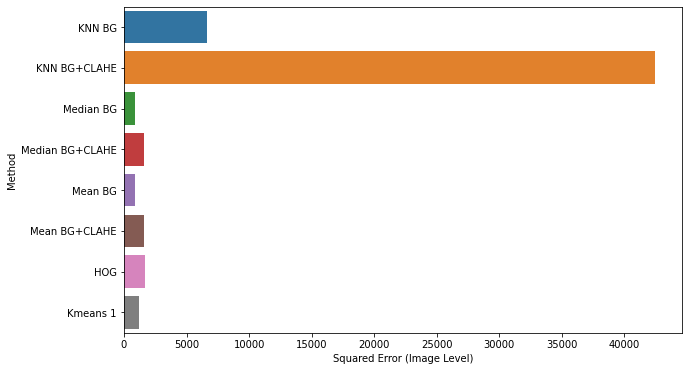

In [102]:
fig, axs = plt.subplots(1,1)
fig.set_figwidth(10)
fig.set_figheight(6)

sns.barplot(y=methods, x=image_level_mses, ax = axs);
axs.set_xlabel("Squared Error (Image Level)");
axs.set_ylabel("Method");

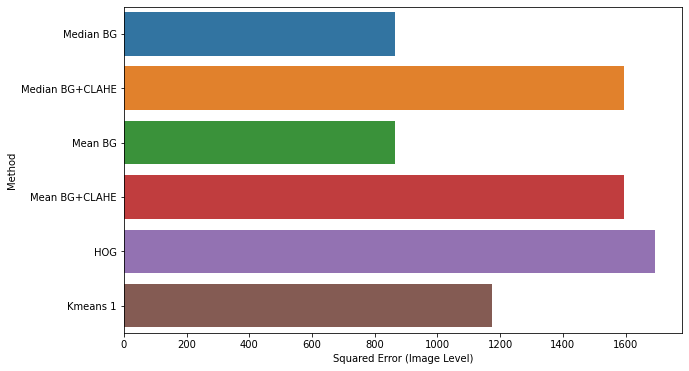

In [103]:
# constuct a dataframe first
fig, axs = plt.subplots(1,1)
fig.set_figwidth(10)
fig.set_figheight(6)

sns.barplot(y=methods[2:], x=image_level_mses[2:], ax = axs);
axs.set_xlabel("Squared Error (Image Level)");
axs.set_ylabel("Method");

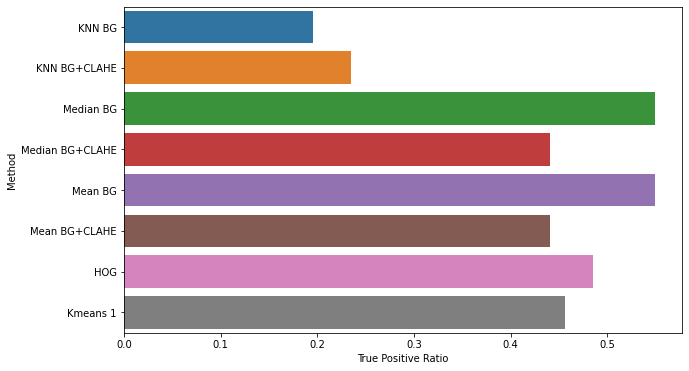

In [109]:
fig, axs = plt.subplots(1,1)
fig.set_figwidth(10)
fig.set_figheight(6)

sns.barplot(y=methods, x=TP, ax = axs);
axs.set_xlabel("True Positive Ratio");
axs.set_ylabel("Method");

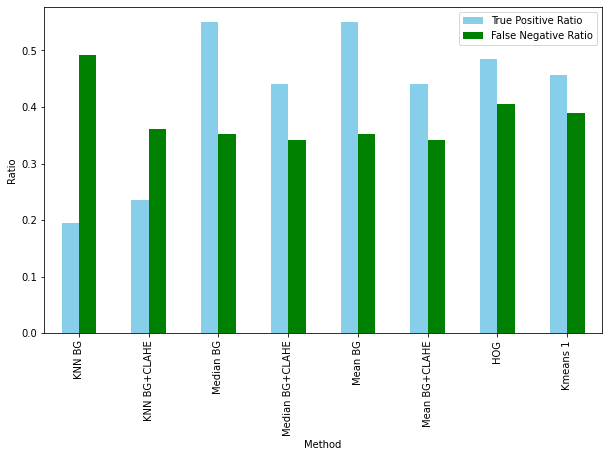

In [120]:
fig, axs = plt.subplots(1,1)
fig.set_figwidth(10)
fig.set_figheight(6)
data = pd.DataFrame({'Method': methods, 'True Positive Ratio': TP, 'False Negative Ratio': FN}, index = methods )
data.plot(kind='bar', color=['skyblue', 'green'], ax=axs)
axs.set_ylabel("Ratio");
axs.set_xlabel("Method");